<img src="http://www.exalumnos.usm.cl/wp-content/uploads/2015/06/Isotipo-Negro.gif" title="Title text" width="20%" height="20%" />


<hr style="height:2px;border:none"/>
<h1 align='center'> INF-393/578 Máquinas de Aprendizaje - 2019-1 </h1>

<H3 align='center'> Tarea 1  </H3>
<hr style="height:2px;border:none"/>

**Temas**  
* Manipulaciones básicas en pandas
* Preprocesamiento y exploración inicial de datos
* Regresión Lineal Multivariada
* PCA, LDA
* Selección de atributos _from scratch_, Métodos Wrapper e Información Mutual
* Selección de modelos por _Cross Validation_


**Formalidades**  
* Equipos de trabajo de 2 personas (*Ambos estudiantes deben estar preparados para presentar la tarea el día de la entrega*)
* El entregable debe ser un _Jupyter Notebook_ incluyendo los códigos utilizados, los resultados, los gráficos realizados y comentarios. Debe seguir una estructura similar a un informe (se debe introducir los problemas a trabajar, presentar los resultados y discutirlos). Si lo prefiere puede entregar un _Jupyter Notebook_ por pregunta o un por toda la tarea, con tal de que todos los entregables esten bien identificados y se encuentren en el mismo repositorio de _Github_.
* Se debe preparar una presentación del trabajo realizado y sus hallazgos. El presentador será elegido aleatoriamente y deberá apoyarse en el _Jupyter Notebook_ que entregarán. 
* Formato de entrega: envı́o de link del repositorio en _Github_ ( en caso de ser repositorio privado, invitar como colaborador al usuario de github "avalderr") al correo electrónico del ayudante (*<alvaro.valderrama.13@sansano.usm.cl>*), en copia al profesor (*<cvalle@inf.utfsm.cl>*). Especificar el siguiente asunto: [INF393/578-2019 Tarea1]
* Fecha de entrega y presentaciones: 26 de Abril. Hora límite de entrega: 23:00. Cualquier _commit_ luego de la hora límite no será evaluado. Se realizará descuento por atrasos en envío del mail. 

<hr style="height:2px;border:none"/>

La tarea se divide en tres partes:

[1.](#primero) Aprendizaje con regresión lineal  
[2.](#segundo) Análisis de audios como datos brutos  
[3.](#tercero) Análisis de emociones en tweets

La tarea tiene ejemplos de códigos con los cuales pueden guiarse en gran parte, sin embargo solo son guias y pueden ser creativos al momento de resolver la tarea. Soluciones creativas o elegantes seran valoradas. También en algunas ocaciones se hacen elecciones arbitrarias, ustedes pueden realizar otras elecciones con tal de que haya una pequeña justificación de por qué su elección es mejor o equivalente.
Recuerden intercalar su código con comentarios y con celdas _Markdown_ con los comentarios de la pregunta y con cualquier analisis, fórmula o explicación que les parezca relevante para justificar sus procedimientos. 
Noten que en general cuando se les pide elegir algo o proponer algo no se evaluará mucho la elección en si, en cambio la argumentación detrás de la elección será lo más ponderado.
Si algun modelo se demora demasiado en correr en su maquina, no olvide que puede correr _Jupyter Notebooks_ en _Collab_ de Google, esto puede ser relevante para las maquinas más lentas al momento de realizar exploraciones con _K-folds_.

<a id="primero"></a>
## 1. Aprendizaje con regresión lineal.

La regresión lineal, modelo que busca la mejor forma de combinar linealmente variables para predecir otra variable numérica es una de las herramientas más básicas a nuestra disposición. Sin embargo se puede encontrar muchas aplicaciones a esta aproximación con buenos resultados, y suele ser un buen punto de partida para problemas totalmente desconocidos por su velocidad de implementar y simpleza de interpretar. Además, al igual que muchas de las técnicas de _Machine Learning_, no tiene un ambito de uso definido, es decir podemos aplicar un metodo similar para problemas radicalmente distintos. 

<img src="https://i.stack.imgur.com/cNJQs.png" style="height:50%;" />

En esta primera parte de la tarea, trabajaremos con un _dataset_ de _Kaggle_ llamado "_Black Friday_", el cual contiene alrededor de medio millón de registros. Este _dataset_ contiene diversas informaciones sobres los consumidores (edad, ocupación, género, entre otros) y el valor de la compra que realizaron al momento de la medición. Pueden descargar el _dataset_ desde https://www.kaggle.com/mehdidag/black-friday. Este _dataset_ fue pensado para intentar de predecir el valor de compra de un cliente en funcion de sus caracteristicas, sin embargo uno puede realizar distintas regresiones y tratar, por ejemplo, de predecir el rango de edad de un cliente basado en sus otras caracteristicas incluyendo el valor de su compra. En esta primera parte utilizaremos el set de datos para hacer regresión lineal sobre el valor de compra, es decir la variable a predecir es el valor de compra. 


 #### 1.a Modulos y carga de datos
 Comenzaremos cargando las librerias relevantes para el resto de la tarea y cargando los datos a un _DataFrame_ para facilitar su manipulación. Explore los tipos de datos que hemos cargado, los valores que tienen estos datos y como se distribuyen. 


In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math

  
import scipy.stats as stats

from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, KFold
from sklearn.linear_model import LinearRegression
from scipy import stats

In [0]:
data = pd.read_csv("BlackFriday.csv")

Vemos las características que contienen los datos

In [0]:
data.columns

Index(['User_ID', 'Product_ID', 'Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category_1',
       'Product_Category_2', 'Product_Category_3', 'Purchase'],
      dtype='object')

##### Descripción de variables


In [0]:
for col in data.columns:
  print(data[col].describe(), "\n *******")

count    5.375770e+05
mean     1.002992e+06
std      1.714393e+03
min      1.000001e+06
25%      1.001495e+06
50%      1.003031e+06
75%      1.004417e+06
max      1.006040e+06
Name: User_ID, dtype: float64 
 *******
count        537577
unique         3623
top       P00265242
freq           1858
Name: Product_ID, dtype: object 
 *******
count     537577
unique         2
top            M
freq      405380
Name: Gender, dtype: object 
 *******
count     537577
unique         7
top        26-35
freq      214690
Name: Age, dtype: object 
 *******
count    537577.00000
mean          8.08271
std           6.52412
min           0.00000
25%           2.00000
50%           7.00000
75%          14.00000
max          20.00000
Name: Occupation, dtype: float64 
 *******
count     537577
unique         3
top            B
freq      226493
Name: City_Category, dtype: object 
 *******
count     537577
unique         5
top            1
freq      189192
Name: Stay_In_Current_City_Years, dtype: object 
 ***

Cuente los valores N/A de cada columna con el siguiente código y explique brevemente porque en un primer momento preferiremos eliminar la segunda y tercera categoría del producto.

 Cuantos registros hay de mujeres y de hombres? Cuanto gastan en promedio los distintos rangos de edad? Entregue alguna otra medicion que le parezca interesante y permita familiarizarse con los datos.

In [0]:
print(pd.read_csv("BlackFriday.csv").isna().sum())
print(data.describe())
print(data.groupby("Gender").User_ID.nunique())
data.head()

User_ID                            0
Product_ID                         0
Gender                             0
Age                                0
Occupation                         0
City_Category                      0
Stay_In_Current_City_Years         0
Marital_Status                     0
Product_Category_1                 0
Product_Category_2            166986
Product_Category_3            373299
Purchase                           0
dtype: int64
            User_ID    Occupation  Marital_Status  Product_Category_1  \
count  5.375770e+05  537577.00000   537577.000000       537577.000000   
mean   1.002992e+06       8.08271        0.408797            5.295546   
std    1.714393e+03       6.52412        0.491612            3.750701   
min    1.000001e+06       0.00000        0.000000            1.000000   
25%    1.001495e+06       2.00000        0.000000            1.000000   
50%    1.003031e+06       7.00000        0.000000            5.000000   
75%    1.004417e+06      14.0000

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,NaN,NaN,8370
1,1000001,P00248942,F,0-17,10,A,2,0,1,6.0,14.0,15200
2,1000001,P00087842,F,0-17,10,A,2,0,12,NaN,NaN,1422
3,1000001,P00085442,F,0-17,10,A,2,0,12,14.0,NaN,1057
4,1000002,P00285442,M,55+,16,C,4+,0,8,NaN,NaN,7969


Se puede apreciar una gran cantidad de datos null en las categorías 2 y 3, debido a ellos se prefiere no trabajar con estas características. Además la cantidad de hombres es mucho mayor, solamente el 30% de los datos pertenecen a mujeres, dando un sesgo a la muestra pero a la vez dándonos información sobre que los hombres son más participes al tema estudiado (Bajo el supuesto de que los datos fueron obtenidos de buena manera, y es una muestra representativa de la población)

In [0]:
dfs = dict(tuple(data.groupby('Age')))
for ag in data['Age'].unique():
  print('Rango etario: ',ag)
  print(dfs[ag].describe()['Purchase'],'\n  *******   ')

Rango etario:  0-17
count    14707.000000
mean      9020.126878
std       5060.498917
min        187.000000
25%       5365.000000
50%       8009.000000
75%      11904.500000
max      23955.000000
Name: Purchase, dtype: float64 
  *******   
Rango etario:  55+
count    20903.000000
mean      9453.898579
std       4939.124514
min        187.000000
25%       6068.000000
50%       8127.000000
75%      11976.000000
max      23960.000000
Name: Purchase, dtype: float64 
  *******   
Rango etario:  26-35
count    214690.000000
mean       9314.588970
std        4974.081415
min         185.000000
25%        5833.000000
50%        8043.000000
75%       12063.000000
max       23961.000000
Name: Purchase, dtype: float64 
  *******   
Rango etario:  46-50
count    44526.000000
mean      9284.872277
std       4921.253566
min        186.000000
25%       5921.000000
50%       8050.000000
75%      12021.750000
max      23960.000000
Name: Purchase, dtype: float64 
  *******   
Rango etario:  51-55
count 

##### análisis
Se puede ver que la gran mayoría de datos corresponde a hombres, además de la gran cantidad de datos sin valor en las categorias 2 y 3, por ende se deberán eliminar mas adelante. 

 #### 1.b Columnas descartadas
De los tipos de datos que tenemos cuales resultarán problematicos para realizar regresión lineal? Del dato "City_Category", cuantos valores distintos existen? (puede usar el metodo .unique por ejemplo)
Porqué a pesar de ser dato numerico las columnas "Product_Category" podrían comportarse mal con la regresión lineal?

In [0]:
for col in data.columns:
  print(col, len(data[col].unique()), data[col].unique())

User_ID 5891 [1000001 1000002 1000003 ... 1004113 1005391 1001529]
Product_ID 3623 ['P00069042' 'P00248942' 'P00087842' ... 'P00038842' 'P00295642'
 'P00091742']
Gender 2 ['F' 'M']
Age 7 ['0-17' '55+' '26-35' '46-50' '51-55' '36-45' '18-25']
Occupation 21 [10 16 15  7 20  9  1 12 17  0  3  4 11  8 19  2 18  5 14 13  6]
City_Category 3 ['A' 'C' 'B']
Stay_In_Current_City_Years 5 ['2' '4+' '3' '1' '0']
Marital_Status 2 [0 1]
Product_Category_1 18 [ 3  1 12  8  5  4  2  6 14 11 13 15  7 16 18 10 17  9]
Product_Category_2 18 [nan  6. 14.  2.  8. 15. 16. 11.  5.  3.  4. 12.  9. 10. 17. 13.  7. 18.]
Product_Category_3 16 [nan 14. 17.  5.  4. 16. 15.  8.  9. 13.  6. 12.  3. 18. 11. 10.]
Purchase 17959 [ 8370 15200  1422 ... 14539 11120 18426]


In [0]:
data.dtypes
data = data.drop(columns=['User_ID','Product_ID','Product_Category_1','Product_Category_2','Product_Category_3']) 

In [0]:
data.columns

Index(['Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Purchase'],
      dtype='object')

 #### 1.c  Datos Categoricos
 Transformaremos ahora los datos no numericos a datos numéricos. Para esto transformaremos el género a una variable binaria como muestra el código siguiente. Transforme todos los datos problematicos de manera similar. Discuta la eleccion realizada para "City_Category", más adelante haremos otra propuesta. Para los rangos de edad puede utilizar el promedio de ambos valores. Discuta si tiene alguna relevancia la elección del valor numerigo (_e.g._ 1 ó 0 para mujer) para el modelo de regresión lineal. Es así en todos los casos o solo para variables binarias?
 Por qué el dato "Occupation" no podemos utilizarlo directamente a pesar de ser numérico? Que solucion nos da el metodo `get_dummies` de pandas?

In [0]:
for col in data.columns:
  print(col, len(data[col].unique()), data[col].unique())

Gender 2 ['F' 'M']
Age 7 ['0-17' '55+' '26-35' '46-50' '51-55' '36-45' '18-25']
Occupation 21 [10 16 15  7 20  9  1 12 17  0  3  4 11  8 19  2 18  5 14 13  6]
City_Category 3 ['A' 'C' 'B']
Stay_In_Current_City_Years 5 ['2' '4+' '3' '1' '0']
Marital_Status 2 [0 1]
Purchase 17959 [ 8370 15200  1422 ... 14539 11120 18426]


In [0]:
data['Gender'] = data.Gender.apply(lambda x: {'F':1,'M':0}[x])
city_cat_dic = {'A':-1, 'C':0, 'B':1}
age_dic = {'0-17':10, '55+':60, '26-35':30, '46-50': 48, '51-55':53, '36-45':40, '18-25': 22}
Stay_In_Current_City_Years_dic = {'2':2,'4+':5, '3':3, '1':1, '0':0}

data['City_Category'] = data.City_Category.apply(lambda x: city_cat_dic[x])
data['Age'] = data.Age.apply(lambda x: age_dic[x])
data['Stay_In_Current_City_Years'] = data.Stay_In_Current_City_Years.apply(lambda x:Stay_In_Current_City_Years_dic[x])

data_pre = pd.get_dummies(data.Occupation)
col = list(data.columns)
col.remove('Occupation')
data_pre[col] = data[col]

In [0]:
data_pre

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,Gender,Age,City_Category,Stay_In_Current_City_Years,Marital_Status,Purchase
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,10,-1,2,0,8370
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,10,-1,2,0,15200
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,10,-1,2,0,1422
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,10,-1,2,0,1057
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,60,0,5,0,7969
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,30,-1,3,0,15227
6,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,48,1,2,1,19215
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,48,1,2,1,15854
8,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,48,1,2,1,15686
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,30,-1,1,1,7871


 #### 1.d  Separación de datos
 Separaremos los datos en _train_, _validation_ y _test_ con 75%, 15% y 10% de los datos respectivamente. Verifique que se cumplen aproximadamente las proporciones. Luego separe el _target_ del resto de las variables que consideraremos. 

In [0]:
data_pre_train, data_pre_temp = train_test_split(data_pre, test_size= 0.25)
data_pre_val, data_pre_test = train_test_split(data_pre_temp, test_size= 0.4)

data_x_train = data_pre_train.drop(columns='Purchase')
data_y_train = data_pre_train['Purchase']

data_x_val = data_pre_val.drop(columns='Purchase')
data_y_val = data_pre_val['Purchase']

data_x_test = data_pre_test.drop(columns='Purchase')
data_y_test = data_pre_test['Purchase'] 


 #### 1.e  Estandarización
 Utilizaremos `Standar_Scaler` para estandarizar los datos antes de entrenar. Que ventaja tiene en su opinion el tener un objeto que permite estandarizar (y hacer la transformación inversa) frente a hacer la opreación aritmetica "manualmente"? Note el cambio de tipo entre `data_x_train` y `x_train`. Tiene utilidad estandarizar el _target_ para este modelo? Guarde el _target_ estandarizado de todas formas para comparar más adelante.

In [0]:
scaler_x = StandardScaler()
scaler_x.fit(data_x_train)
x_tr = scaler_x.transform(data_x_train) #scaled
x_val = scaler_x.transform(data_x_val)
x_test = scaler_x.transform(data_x_test)

scaler_y = StandardScaler()
scaler_y.fit(data_y_train.values.reshape(-1,1))
y_tr = scaler_y.transform(data_y_train.values.reshape(-1,1)) 
y_val = scaler_y.transform(data_y_val.values.reshape(-1,1))
y_test = scaler_y.transform(data_y_test.values.reshape(-1,1))

/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
  """
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float6

 #### 1.f Primera Regresión
 Realice una regresión lineal con los datos escalados y no escalados. Compare sus _scores_. Cual es la formula del _score_ que utiliza el regresor (puede buscar en la documentación)? Qué interpretación se le puede dar al _score_? Puede concluir que los datos escalados o no escalados entregan un mejor modelo? Sobre que conjunto de datos (_train_, _test_ o _valitdation_) deberíamos comparar el _score_?

In [0]:
# Not scaled
reg = LinearRegression()
reg.fit(data_x_train,data_y_train)
print(reg.score(data_x_test,data_y_test))
    
# Scaled
reg_scaled = LinearRegression()
reg_scaled.fit(x_tr,y_tr)
print(reg_scaled.score(x_test,y_test))

0.006286289708049009
0.006288081763111686


 #### 1.g  Tranformaciones simples
 Grafique como se distribuyen los precios, apoyese en el siguiente código. Recuerde que los gráficos deben ir acompañados de título, nombre de ejes entre otros.
 Viendo el gráfico, pareciera que una representación lineal funcionará bien para modelar este tipo de datos?
 
Prueba algunas transformaciones simples, como logaritmo o raiz cuadrada y comente los gráficos. 

Estos gráficos permiten concluir algo sobre el comportamiento de un modelo lineal o solo sirven de caracter exploratorio?

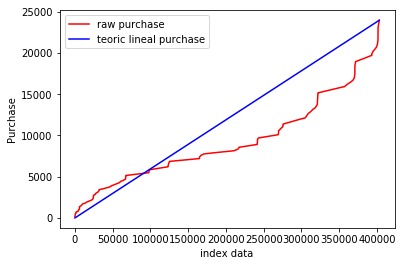

In [0]:
x_ax = np.arange(0,data_y_train.shape[0],1)
y_ax = data_y_train.sort_values()

x_ax_lineal = np.arange(0,data_y_train.shape[0],1)
y_ax_lineal = np.linspace(0,((data_y_train.sort_values())).max(),num=data_y_train.shape[0])

plt.plot(x_ax,y_ax,'r',label='raw purchase')
plt.plot(x_ax_lineal,y_ax_lineal,'b',label='teoric lineal purchase')
plt.xlabel('index data')
plt.ylabel('Purchase')
plt.legend()
plt.show()

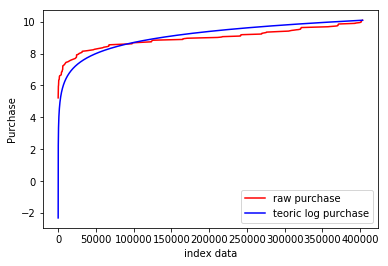

In [0]:
import math

def log(x):
  return math.log(x)

log_v = np.vectorize(log)

x_ax = np.arange(0,data_y_train.shape[0],1)
y_ax = log_v(data_y_train.sort_values())

x_ax_log = np.arange(0,data_y_train.shape[0],1)
y_ax_log = log_v(np.linspace(0.1,((data_y_train.sort_values())).max(),num=data_y_train.shape[0]))

plt.plot(x_ax,y_ax,'r',label='raw purchase')
plt.plot(x_ax_log,y_ax_log,'b',label='teoric log purchase')
plt.xlabel('index data')
plt.ylabel('Purchase')
plt.legend()
plt.show()

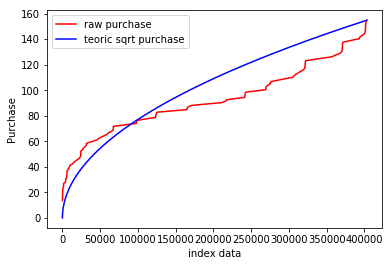

In [0]:
def root(x):
  return math.sqrt(x)

sqrt_v = np.vectorize(root)

x_ax = np.arange(0,data_y_train.shape[0],1)
y_ax = sqrt_v(data_y_train.sort_values())

x_ax_sqrt = np.arange(0,data_y_train.shape[0],1)
y_ax_sqrt = sqrt_v(np.linspace(0,((data_y_train.sort_values())).max(),num=data_y_train.shape[0]))

plt.plot(x_ax,y_ax,'r',label='raw purchase')
plt.plot(x_ax_sqrt,y_ax_sqrt,'b',label='teoric sqrt purchase')
plt.xlabel('index data')
plt.ylabel('Purchase')
plt.legend()
plt.show()

#### 1.h 10-_fold_ sobre la potencia
Probaremos la utilidad real de realizar una transformación del target del tipo $P \gets P^{i}$ con $i \in [0,2]$ haciendo 10-_fold_ variando el valor de $i$ en a lo menos 10 incrementos. Puede basarse en la estrucuta siguiente. Debe elegir un estimador del error de validación de cada modelo (_e.g._ mediana, promedio...) y comentar brevemente por qué eligio tal estimador. 
Luego grafique como varia el error de validación en función de _i_. 
Finalmente, con el mejor valor de $i$ encontrado, entrene un regresor lineal con todos los datos de entrenamiento y compare su densempeño con los modelos anteriores.
Puede afirmar que alguna de las transformaciones mejore el desempeño del modelo? 

In [0]:
folds = KFold(10)
mat = list()

for i in range(1,21):
  row = list()
  for train_index, test_index in folds.split(x_tr):
    #print("TRAIN:", train_index, "TEST:", test_index)
    y_i = data_y_train.values**(i/10)
    
    X_train, X_test = x_tr[train_index], x_tr[test_index]
    y_train, y_test = y_i[train_index], y_i[test_index]

    # entrene el modelo y guarde su score
    reg = LinearRegression()
    reg.fit(X_train,y_train)
    scr = reg.score(X_test,y_test)
    row.append(scr)
    
  mat.append(row)
  print('listo i=',str(i))

listo i= 1
listo i= 2
listo i= 3
listo i= 4
listo i= 5
listo i= 6
listo i= 7
listo i= 8
listo i= 9
listo i= 10
listo i= 11
listo i= 12
listo i= 13
listo i= 14
listo i= 15
listo i= 16
listo i= 17
listo i= 18
listo i= 19
listo i= 20


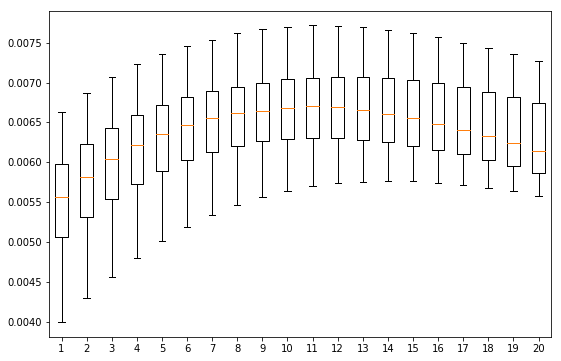

In [0]:
# Create a figure instance
fig = plt.figure(1, figsize=(9, 6))

# Create an axes instance
ax = fig.add_subplot(111)

# Create the boxplot
bp = ax.boxplot(mat)

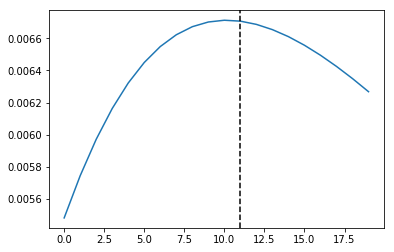

In [0]:
means = list()
M = -1.
ind = -1
for i in range(len(mat)):
  m = stats.describe(np.array(mat[i])).mean
  means.append(m)
  if m>M:
    M = m
    ind = i
means = np.array(means)
plt.plot(np.array(means))
plt.axvline(x=ind+1, color='k', linestyle='--')


Elijo i=11, muetra mejores valores y una varaibilidad similar a los mejores boxplot, además de tener el promedio promedio.

#### 1.i _Q-Q plot_
Gráfique el _Quantile-Quantile Plot_ del residuo (error) de validación del merjo modelo que haya encontrado. Qué puede decir respecto al supuesto de normalidad de los residuos en los datos? 

((array([-4.20779452, -4.00280872, -3.89108145, ...,  3.89108145,
          4.00280872,  4.20779452]),
  array([-44772.08260312, -44161.54905717, -43998.55127861, ...,
          24761.5999812 ,  25029.54406274,  25309.79289945])),
 (13340.653657783303, -57.817614891025066, 0.9712584294705371))

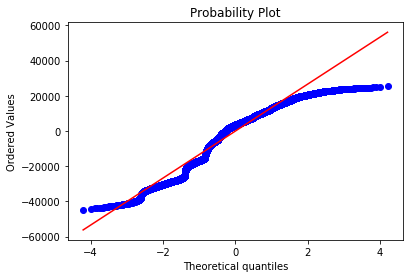

In [0]:
mod = LinearRegression()
mod.fit(data_x_train,data_y_train**(11./10))
y_pred = mod.predict(data_x_test)
err = (y_pred - data_y_test**(11./10))

stats.probplot(err ,dist='norm', plot=plt)
# puede necesitar hacer err.reshape((1,)) si obtiene errror "ValueError: all the input array dimensions except for the concatenation axis must match exactly"

#### 1.j Variables categoricas
Entrene ahora el modelo que mejor resultado obtuvo pero esta vez utilizando todos los atributos, transformando las variables categoricas no binarias. Como las variables categóricas no se relacionan linealmente al _target_ (pues no representan un valor numérico), debe transformarlas a variables binarias de igual manera que se realizó con la variable "Occupation" en la parte 1.c. 
Debe cargar de nuevo el DataFrame original pues borramos las columnas de categoría de producto.
Discuta por qué podría resultar útil agregar de esta misma manera el dato "City_Category" y no como se hizo inicialmente. 
Discuta los resultados obtenidos en comparación con la parte anterior.

In [0]:
data = pd.read_csv("BlackFriday.csv")
data = data.drop(columns=['User_ID','Product_ID','Product_Category_2','Product_Category_3']) 
data['Product_Category_1'] = np.array(data['Product_Category_1'])*10

for col in data.columns:
  print(col, len(data[col].unique()), data[col].unique()) 

Gender 2 ['F' 'M']
Age 7 ['0-17' '55+' '26-35' '46-50' '51-55' '36-45' '18-25']
Occupation 21 [10 16 15  7 20  9  1 12 17  0  3  4 11  8 19  2 18  5 14 13  6]
City_Category 3 ['A' 'C' 'B']
Stay_In_Current_City_Years 5 ['2' '4+' '3' '1' '0']
Marital_Status 2 [0 1]
Product_Category_1 18 [ 30  10 120  80  50  40  20  60 140 110 130 150  70 160 180 100 170  90]
Purchase 17959 [ 8370 15200  1422 ... 14539 11120 18426]


In [0]:
gender_dic = {'F':1,'M':0}
city_cat_dic = {'A':-1, 'C':0, 'B':1}
age_dic = {'0-17':10, '55+':60, '26-35':30, '46-50': 48, '51-55':53, '36-45':40, '18-25': 22}
Stay_In_Current_City_Years_dic = {'2':2,'4+':5, '3':3, '1':1, '0':0}

data['Gender'] = data.Gender.apply(lambda x: gender_dic[x])
data['City_Category'] = data.City_Category.apply(lambda x: city_cat_dic[x])
data['Age'] = data.Age.apply(lambda x: age_dic[x])
data['Stay_In_Current_City_Years'] = data.Stay_In_Current_City_Years.apply(lambda x:Stay_In_Current_City_Years_dic[x])

data_pre = pd.get_dummies(data.Occupation)
col = list(data.columns)
col.remove('Occupation')
data_pre[col] = data[col]

data_pre = pd.get_dummies(data.Product_Category_1)
col = list(data.columns)
col.remove('Product_Category_1')
data_pre[col] = data[col]

data_pre

In [0]:
data_pre_train, data_pre_temp = train_test_split(data_pre, test_size= 0.25)
data_pre_val, data_pre_test = train_test_split(data_pre_temp, test_size= 0.4)

data_x_train = data_pre_train.drop(columns='Purchase')
data_y_train = data_pre_train['Purchase']

data_x_val = data_pre_val.drop(columns='Purchase')
data_y_val = data_pre_val['Purchase']

data_x_test = data_pre_test.drop(columns='Purchase')
data_y_test = data_pre_test['Purchase'] 

scaler_x = StandardScaler()
scaler_x.fit(data_x_train)
x_tr = scaler_x.transform(data_x_train) #scaled
x_val = scaler_x.transform(data_x_val)
x_test = scaler_x.transform(data_x_test)

scaler_y = StandardScaler()
scaler_y.fit(data_y_train.values.reshape(-1,1))
y_tr = scaler_y.transform(data_y_train.values.reshape(-1,1)) 
y_val = scaler_y.transform(data_y_val.values.reshape(-1,1))
y_test = scaler_y.transform(data_y_test.values.reshape(-1,1))

# Not scaled
reg = LinearRegression()
reg.fit(data_x_train,data_y_train)
print(reg.score(data_x_test,data_y_test))
    
# Scaled
reg_scaled = LinearRegression()
reg_scaled.fit(x_tr,y_tr)
print(reg_scaled.score(x_test,y_test))

/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
  from ipykernel import kernelapp as app
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversion

0.6270275329722438
0.6270279722197148


<a id="segundo"></a>
## 2. Selección de Atributos. 

En esta segunda parte de la tarea estudiaremos un _dataset_ llamado "House Sales in King County", un conjunto de datos de ventas de casas, con diversa información sobre las casas vendidas y los precios de venta. Por la naturaleza variada de las casas y las percepciones de las personas que las compran el problema de predecir el valor de una casa a ser vendida resulta interesante pues si bien muchos supuestos razonables se cumplen la mayoría de las veces (una casa más grande suele costar más que una más chica), la percepción de los compradores puede cambiar mucho por caracteristicas dificiles de medir. 

<img src="https://pngimage.net/wp-content/uploads/2018/06/house-for-sale-sign-png-6.png"  style="height:14cm;"  />

Sin embargo, resulta facil imaginar que algunos de los datos resultan más relevantes que otros al momento de predecir, por esto haremos selección de atributos en esta parte de la pregunta. Este _dataset_ es mucho más limpio que lo usual, por lo cual la exploración inicial sera bastante corta. Luego de explorar los datos deberan realizar una exploración de los distintos atributos para evaluar que tan relevantes son en la predicción del resultado. Puede descargar el _dataset_ desde https://www.kaggle.com/harlfoxem/housesalesprediction donde también encontrará una descripción de las distintas columnas.

#### 2.a Carga de datos 

Cargue los datos a un DataFrame. Transformaremos la columna "date" como indica el siguiente código. Que transformación realiza este código? Elimine las columnas que le parezca pertinente. 

In [0]:
def to_num(date):
    nums = list(date)
    res = 0
    for i in range(8):
        res = res + int(nums[i])*(10**(7-i))
    return res
data['date'] = data.date.apply(to_num).rank()

#### 2.b Preprocesamiento de los datos y visualización
Escale los datos de la misma forma que en la pregunta 1. Realice _Scatter plots_ de algunas pares (atributo, precio) que ustedes crean sean más significativos. Comente.

En este caso es recomendable estandarizar "a mano", pues mantener la estructura de DataFrame facilitará el ítem siguiente. En todo caso, puede elegir la opción que prefiera. 

Si la curiosidad, imaginación y tiempo le alcanza pruebe también realizando algunas transformaciones simples (logaritmica, cuadrática, _etc._)

[//]: <> ( https://vignette.wikia.nocookie.net/inciclopedia/images/6/6a/Bob_esponja_caja_de_imaginacion.JPG/revision/latest?cb=20081122000821 )

In [0]:
# scaler

plt.figure(figsize=(18,9))
plt.scatter(data.sqft_above,data.price)
# titles and stuff (:


#### 2.c Selección de Atributos _by hand_
En esta parte comensaremos entrenando un modelo sin ningun atributo y luego iremos agregando 1 a 1 el atributo que más mejora los resultados de la predicción. En cada paso validaremos qué atributo es el mejor utilizando 5-_fold_ como aprendió en la pregunta anterior. 
Para el modelo sin ningun atributo utilizaremos una predicción constante igual al promedio de los datos de entrenamiento. Luego, en cada iteración, evaluaremos cada uno de los atributos restantes, viendo cual reduce más el error. El error que utilizaremos para esta pregunta sera el MSE o _Mean Square Error_. Luego de elegido un atributo, lo agregamos a la lista de atributos a utilizar y continuamos iterando hasta agotar los atributos restantes. 
Guarde los errores promedio a medida va agregando atributos al modelo y guarde la lista de los atributos que fue agregando, luego grafíque el error promedio en función del nuemero de atributos seleccionado.
Cual es el modelo que entrenga un menor error de validación (cual es su lista de atributos)?

In [0]:
# esta estructura de código es solo una guía y presupone que x_tr es un DataFrame
restantes = list(x_tr.columns)
actuales = []
error_actual = ((y_tr-y_tr.mean())**2).mean()
while restantes:
    for atributo_candidato in restantes:
        # crear nuevo modelo
        # hacer 5- fold 
            model.fit(x_tr[actuales+[atributo_candidato]], y_tr)
            #calcular MSE 
        # promediar MSE y guardar
    # evaluar cual se queda y quitarlo de restantes
    

#### 2.d Validar
Utilizando la lista de atributos que calculó en la pregunta anterior, realice un gráfico de como varía el error de entrenamiento (error sobre `x_tr`) y de validación (sobre `x_val`) a medida va agregando los atributos. Comente como sus hallazgos se relacionan con lo aprendido teóricamente. 

#### 2.e Mutual information
Calcule la Información Mutual para nuestros datos. Note que esta función ya esta implementada.
Que información puede obtener de estos resultados? Concuerdan los datos encontrados con lo encontrado en la pregunta anterior? 

In [0]:
from sklearn.feature_selection import mutual_info_regression
MI = list(zip(mutual_info_regression(x_tr, y_tr),x_tr.columns))

#### 2.f Más variables
Repita lo realizado en la pregunta 2.c (incluyendo gráficos) pero agregando la variable categorica `zipcode` utilizando nuevamente `pd.get_dummies`. Esta vez puede optar por no realizar _K-fold_ si no entrenar una sola vez cada modelo pues podría resultar demasiado demandante en tiempo utilizar _K-fold_, aunque siempre es valorado. 
Qué modelo se comporta mejor y por qué cree que sucede esto? 

<a id="tercero"></a>
## 3. Clasificación. 

Para esta última parte de la tarea, utilizaremos un conjunto de datos de mediciones al corazón en pacientes con o sin cierta condicion cardiaca. El _dataset_ puede descargarse desde https://www.kaggle.com/shayanfazeli/heartbeat#ptbdb_abnormal.csv, utilizaremos en particular los archivos `ptbdb_normal.csv` y `ptbdb_abnormal.csv`. Nuestro objetivo principal será predecir a partir de las mediciones si un paciente tiene o no tiene la condición. Sin embargo también exploraremos técnicas de reducción de dimensionalidad para tratar de preprocesar los datos, pues una rápida exploración de los datos nos muestra que tenemos 188 atributos. 

#### 3.a Carga de datos
Cargue los datos, cree la columna `target` y junte ambos DataFrame en uno solo con método `append`. Por que es necesario pasar una lista de id al cargar los datos?

Explore rápidamente los datos: estan muy desbalanceadas las clases? Que tan dispares son las magnitudes de las mediciones? Pareciera necesario estandarizar los datos antes de utilizarlos? 

Separe los datos utilizando `train_test_split`. Qué habria ocurrido por la forma en que se cargaron los datos si utilizamos la opción `shuffle = False`? 

In [0]:
data_normal = pd.read_csv("ptbdb_normal.csv",names=[i for i in range(188)])
data_abnormal = pd.read_csv('ptbdb_abnormal.csv',names=[i for i in range(188)])
data_normal['target'] = 0 
data_abnormal['target'] = 1
data = pd.concat([data_normal,data_abnormal])
print('normal: ',len(data_normal))
print('abnormal: ',len(data_abnormal))
data.describe()

normal:  4046
abnormal:  10506


,0,1,2,3,4,5,6,7,8,9,...,179,180,181,182,183,184,185,186,187,target
count,14552.000000,14552.000000,14552.000000,14552.000000,14552.000000,14552.000000,14552.000000,14552.000000,14552.000000,14552.000000,...,14552.000000,14552.000000,14552.000000,14552.000000,14552.000000,14552.000000,14552.000000,14552.0,14552.000000,14552.000000
mean,0.976637,0.721663,0.403099,0.242893,0.207218,0.216453,0.221752,0.224486,0.227349,0.229704,...,0.001133,0.000900,0.000739,0.000661,0.000475,0.000177,0.000185,0.0,0.721963,0.721963
std,0.034532,0.195690,0.249794,0.249519,0.218097,0.192412,0.180740,0.176943,0.176674,0.176579,...,0.021012,0.017316,0.014640,0.014033,0.012289,0.006545,0.006835,0.0,0.448047,0.448047
min,0.624227,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
25%,0.959377,0.584589,0.212300,0.052269,0.061875,0.090487,0.096503,0.097095,0.097231,0.097144,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
50%,1.000000,0.740148,0.371911,0.168148,0.136082,0.159451,0.167479,0.171541,0.177380,0.180337,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,1.000000
75%,1.000000,0.881483,0.557785,0.336232,0.264104,0.264633,0.286484,0.302255,0.311664,0.325292,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.985523,0.993213,0.997738,...,0.773743,0.789804,0.628177,0.602033,0.644880,0.371502,0.376668,0.0,1.000000,1.000000


In [0]:
data_train, data_temp = train_test_split(data, test_size= 0.25)
data_val, data_test = train_test_split(data_temp, test_size= 0.4)

#### 3.b Correlación
Calcule la matriz de correlación, note que esto esta implementado en pandas. Representela de alguna forma que le parezca adecuada, por ejemplo como un _heatmap_. 
Qué observa, comente.  Elimine las columnas que muestra el código. 

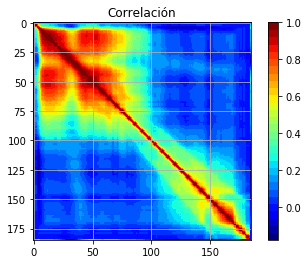

In [0]:
from matplotlib import cm as cm
def correlation_matrix(df):
    fig = plt.figure()
    ax1 = fig.add_subplot(111)
    cmap = cm.get_cmap('jet', 30)
    cax = ax1.imshow(df.corr(), interpolation="nearest", cmap=cmap)
    ax1.grid(True)
    plt.title('Correlación')
    #labels=['Sex','Length','Diam','Height','Whole','Shucked','Viscera','Shell','Rings',]
    #ax1.set_xticklabels(labels,fontsize=6)
    #ax1.set_yticklabels(labels,fontsize=6)
    # Add colorbar, make sure to specify tick locations to match desired ticklabels
    fig.colorbar(cax)
    plt.show()

#data = data.drop(columns=[184,185,186,187])
correlation_matrix(data)

In [0]:
corr = data.corr()
corr.style.background_gradient(cmap='coolwarm')

#### 3.c Regresión Logistica
Realice una primera regresión logística con los datos. Que valor entrega el metodo `score`?

Calcule la matriz de confusión y comente respecto al valor dado por el `score`. Comente sobre la distinta información entregrada por la matriz de confusión y su interpretación. 

In [0]:
data_train = data_train.drop(columns=[184,185,186,187])
data_test = data_test.drop(columns=[184,185,186,187])

y_train = data_train['target']
x_train = data_train.drop(columns='target')

y_test = data_test['target']
x_test = data_test.drop(columns='target')

print(y_train.shape,x_train.shape,y_test.shape,x_test.shape)

(10914,) (10914, 184) (1456,) (1456, 184)


In [0]:
from sklearn import model_selection
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression

reg = LogisticRegression()
reg.fit(x_train,y_train)
print('score: ',reg.score(x_test,y_test))

predicted_labels = reg.predict(x_test)
real_labels = y_test
confusion_matrix = confusion_matrix(real_labels, predicted_labels)
print(confusion_matrix)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


score:  0.8241758241758241
[[244 182]
 [ 74 956]]


#### 3.d Otra métrica. 
Otra forma de comparar modelos podría ser con la siguiente métrica. Esta mide la cantidad de aciertos pero toma en cuenta algo más. Que interpretación podría darle a la métrica en el código? 

Si un modelo entrega 0.5 y otro 0.4 en esta métrica, cual es mejor? 

In [0]:
data_val = data_val.drop(columns=[184,185,186,187])

y_val = data_val['target']
x_val = data_val.drop(columns='target')

In [0]:
reg.predict_proba(x_val)

array([[0.34517376, 0.65482624],
       [0.16223831, 0.83776169],
       [0.08987016, 0.91012984],
       ...,
       [0.90825766, 0.09174234],
       [0.38799537, 0.61200463],
       [0.39939964, 0.60060036]])

In [0]:
np.max(reg.predict_proba(x_val),axis=1)

array([0.65482624, 0.83776169, 0.91012984, ..., 0.90825766, 0.61200463,
       0.60060036])

In [0]:
np.mean((np.max(reg.predict_proba(x_val),axis=1)*(reg.predict(x_val)-y_val))**2)

0.08825771696768678

#### 3.e PCA y LDA
Transforme los datos mediante PCA a 2 dimensiones y grafique un subsampleo de alrededor de 50 - 100 datos con 50% de cada clase. Coloree cada punto correspondiente a la clase a la que pertenece. 

Realice el mismo analisis para LDA, considerando el mismo conjunto de puntos. Cual de ambos métodos le parece más apropiado?

Grafíque el centro de gravedad (promedio en cada cordenada) de cada una de las clases luego de la reducción de dimensionalidad. 

In [0]:
data_normal = pd.read_csv("ptbdb_normal.csv",names=[i for i in range(188)])
data_normal = data_normal.drop(columns=[184,185,186,187])
data_abnormal = pd.read_csv('ptbdb_abnormal.csv',names=[i for i in range(188)])
data_abnormal = data_abnormal.drop(columns=[184,185,186,187])
x_class_1 = data_normal
x_class_2 = data_abnormal
data_normal['target'] = 0 
data_abnormal['target'] = 1
y_class_1 = data_normal['target']
y_class_2 = data_abnormal['target']

In [0]:
x_class_1

,0,1,2,3,4,5,6,7,8,9,...,175,176,177,178,179,180,181,182,183,target
0,1.000000,0.900324,0.358590,0.051459,0.046596,0.126823,0.133306,0.119125,0.110616,0.113047,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,1.000000,0.794681,0.375387,0.116883,0.000000,0.171923,0.283859,0.293754,0.325912,0.345083,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.909029,0.791482,0.423169,0.186712,0.000000,0.007836,0.063032,0.077002,0.074957,0.077342,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,1.000000,0.478893,0.056760,0.064176,0.081289,0.072732,0.055619,0.048774,0.054478,0.041643,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,1.000000,0.867238,0.201360,0.099349,0.141336,0.120934,0.108516,0.096393,0.093436,0.100828,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
5,0.948983,0.505265,0.004176,0.022513,0.059550,0.107298,0.110385,0.111293,0.116558,0.118192,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
6,1.000000,0.487680,0.114305,0.000000,0.030116,0.065024,0.060917,0.050992,0.053388,0.051677,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
7,1.000000,0.460381,0.122178,0.009296,0.125719,0.220009,0.267375,0.262948,0.260292,0.274015,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
8,1.000000,0.755102,0.135116,0.000000,0.285714,0.331457,0.256861,0.258269,0.253343,0.277270,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
9,1.000000,0.706176,0.323144,0.101684,0.013724,0.222707,0.285714,0.295696,0.325016,0.350593,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


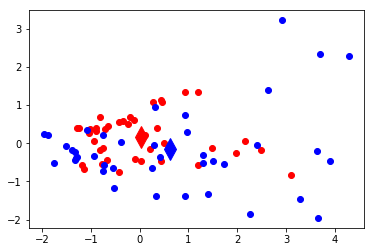

In [0]:
from sklearn import decomposition,discriminant_analysis
import random

pca = decomposition.PCA(n_components=2)
X_class1_pca = pca.fit_transform(x_class_1,y_class_1)
X_class2_pca = pca.fit_transform(x_class_2,y_class_2)
new_array = random.sample(list(X_class1_pca),40)
class1 = np.array(new_array)
new_array = random.sample(list(X_class2_pca),40)
class2 = np.array(new_array)
plt.plot(class1[:,0],class1[:,1],'ro',class2[:,0],class2[:,1],'bo')
plt.plot(class1[:,0].mean(),class1[:,1].mean(),'rd',markersize=15)
plt.plot(class2[:,0].mean(),class2[:,1].mean(),'bd',markersize=15)
plt.show()

In [0]:
from sklearn import discriminant_analysis 
import random

data = pd.concat([data_normal,data_abnormal])

y_data = data['target']
x_data = data.drop(columns='target')

lda = discriminant_analysis.LinearDiscriminantAnalysis(n_components=2)
X_class = lda.fit_transform(x_data,y_data)
class1 = list()
class2 = list()

while(len(class1)<40 and len(class2)<40):
  index = np.random.choice(y_data.shape[0], 1, replace=False)  
  if(y_data.values[index[0]]==0 and len(class1)<40):
    class1.append(X_class[index[0]][0])
  if(y_data.values[int(index)]==1 and len(class1)<40):
    class2.append(X_class[index[0]][0])
print(class1,class2)


[-1.3841422933877283, -1.534677696514974, -1.3934226739207858, -0.8199765294898117, -1.8220715529778275, -1.730282480043292, -0.33690155149021467, -1.0289573334862943, 0.36617752042755225, -1.6592978834436722, -1.596606180344439] [0.7298105032216627, 0.2466746999576202, 2.3953358217870933, -1.3388632217527632, -0.356812897589714, -0.22153965155756553, -2.1696153680269, 0.24659384028663195, -0.4663030494193313, -0.5420057498622758, 0.16105387587814055, -1.1371679473515737, 0.42860978654712645, 0.08654920012990232, 2.189812427627531, 1.1117310866769035, -0.6582225336759423, 0.36630033809229157, -0.3017466307504732, -0.1461746101708147, 1.9169490187520675, -0.02162452355021071, 0.5394809672217985, -0.5805439128607369, -1.7927307862198458, 1.2280779023217456, 0.9561758736793272, 1.988611160416814, -0.9487347461336565, 2.182015308442153, -0.5709719226484263, -0.5138342111861066, -0.14647004713356668, -0.4668481087320458, -1.1872612310022854, 1.099960458279289, -0.627274082590098, 1.32336143

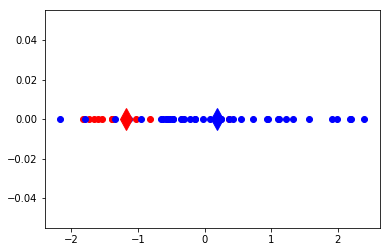

In [0]:
center1 = sum(class1)/len(class1)
center2 = sum(class2)/len(class2)
plt.plot(class1, np.zeros_like(class1), 'ro',class2, np.zeros_like(class2), 'bo')
plt.plot(center1,0,'rd',markersize=15)
plt.plot(center2,0, 'bd',markersize=15)
plt.show()

#### 3.f Más reducción de dimensionalidad
Entrene un modelo de regresión logística para el método que le pareció más apropiado de la pregunta aterior, haciendo variar el numero de componentes de 2 a 120. Calcule para cada modelo alguna métrica de la calidad del modelo tanto sobre el conjunto de entrenamiento como sobre el conjunto de validación. 

Grafíque como varían ambos errores en función de la dimensionalidad sobre la que se trabaja. 

Si le sobra *tiempo* y _c r e a t i v i d a d_  proponga cambios o extienda la exploración buscando mejorar el desempeño o comprender mejor el problema (solo para puntaje extra).

[//]: <> (  https://meme.xyz/uploads/posts/t/l-27712-i-procrastinate-to-the-last-minute-den-i-freaked-it.jpg )

In [0]:
from sklearn import decomposition,discriminant_analysis
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error

data_normal = pd.read_csv("ptbdb_normal.csv",names=[i for i in range(188)])
data_normal = data_normal.drop(columns=[184,185,186,187])
data_abnormal = pd.read_csv('ptbdb_abnormal.csv',names=[i for i in range(188)])
data_abnormal = data_abnormal.drop(columns=[184,185,186,187])
x_class_1 = data_normal
x_class_2 = data_abnormal
data_normal['target'] = 0 
data_abnormal['target'] = 1
y_class_1 = data_normal['target']
y_class_2 = data_abnormal['target']

errors = list()
scor = list()

y_train_1, y_val_1 = train_test_split(y_class_1, test_size= 0.20)
y_train_2, y_val_2 = train_test_split(y_class_2, test_size= 0.20)
y_train = np.concatenate((y_train_1,y_train_2),axis=0)
y_val = np.concatenate((y_val_1,y_val_2),axis=0)

for comp in (np.linspace(2,120,20)):
  # PCA
  pca = decomposition.PCA(n_components=int(comp))
  X_class1_pca = pca.fit_transform(x_class_1,y_class_1)
  X_class2_pca = pca.fit_transform(x_class_2,y_class_2)
  
  # Group of data
  x_train_1, x_val_1 = train_test_split(X_class1_pca, test_size= 0.20)
  x_train_2, x_val_2 = train_test_split(X_class2_pca, test_size= 0.20)
  x_train = np.concatenate((x_train_1,x_train_2),axis=0)
  x_val = np.concatenate((x_val_1,x_val_2),axis=0)
  print(x_train.shape)
  print(y_train.shape)
  print(x_val.shape)
  print(y_val.shape)
  
  # LogReg
  reg = LogisticRegression(solver='lbfgs')
  reg.fit(x_train,y_train)
  
  s = reg.score(x_val,y_val)
  
  y_pred = reg.predict(x_val)
  e = mean_squared_error(y_val, y_pred)
  
  scor.append(s)
  errors.append(e)
  
  print(s,e)

(11640, 2)
(11640,)
(2912, 2)
(2912,)
0.7218406593406593 0.27815934065934067
(11640, 8)
(11640,)
(2912, 8)
(2912,)
0.7218406593406593 0.27815934065934067
(11640, 14)
(11640,)
(2912, 14)
(2912,)
0.7218406593406593 0.27815934065934067
(11640, 20)
(11640,)
(2912, 20)
(2912,)
0.7218406593406593 0.27815934065934067
(11640, 26)
(11640,)
(2912, 26)
(2912,)
0.7218406593406593 0.27815934065934067
(11640, 33)
(11640,)
(2912, 33)
(2912,)
0.7218406593406593 0.27815934065934067
(11640, 39)
(11640,)
(2912, 39)
(2912,)
0.7218406593406593 0.27815934065934067
(11640, 45)
(11640,)
(2912, 45)
(2912,)
0.7218406593406593 0.27815934065934067
(11640, 51)
(11640,)
(2912, 51)
(2912,)
0.7218406593406593 0.27815934065934067
(11640, 57)
(11640,)
(2912, 57)
(2912,)
0.7218406593406593 0.27815934065934067
(11640, 64)
(11640,)
(2912, 64)
(2912,)
0.7218406593406593 0.27815934065934067
(11640, 70)
(11640,)
(2912, 70)
(2912,)
0.7218406593406593 0.27815934065934067
(11640, 76)
(11640,)
(2912, 76)
(2912,)
0.72184065934065

In [0]:
from sklearn import decomposition,discriminant_analysis
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error

data_normal = pd.read_csv("ptbdb_normal.csv",names=[i for i in range(188)])
data_abnormal = pd.read_csv('ptbdb_abnormal.csv',names=[i for i in range(188)])
data_abnormal = data_abnormal.drop(columns=[184,185,186,187])
data_normal = data_normal.drop(columns=[184,185,186,187])
x_class_1 = data_normal
x_class_2 = data_abnormal
data_normal['target'] = 0 
data_abnormal['target'] = 1
y_class_1 = data_normal['target']
y_class_2 = data_abnormal['target']
data = pd.concat([data_normal,data_abnormal])

errors = list()
scor = list()

data_train, data_test = train_test_split(data, test_size= 0.25)

y_train = data_train['target']
x_train = data_train.drop(columns='target')

y_test = data_test['target']
x_test = data_test.drop(columns='target')

for comp in (np.linspace(2,120,20)):
  # PCA
  pca = decomposition.PCA(n_components=int(comp))
  x_train_pca = pca.fit_transform(x_train,y_train)
  
  # LogReg
  reg = LogisticRegression(solver='lbfgs')
  reg.fit(x_train_pca,y_train)
  
  x_test_pca = pca.fit_transform(x_test,y_test)
  s = reg.score(x_test_pca,y_test)
  
  y_pred = reg.predict(x_test_pca)
  e = mean_squared_error(y_test, y_pred)
  
  scor.append(s)
  errors.append(e)
  
  print(s,e)

0.7182517866959868 0.2817482133040132
0.7924683892248489 0.20753161077515117
0.7861462341946124 0.21385376580538756
0.7614073666849918 0.23859263331500824
0.7641561297416163 0.23584387025838371
0.7680043980208906 0.2319956019791094
0.7740516767454645 0.22594832325453545
0.7726772952171522 0.22732270478284772
0.7704782847718527 0.22952171522814732


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


0.7666300164925783 0.23336998350742166
0.7652556349642661 0.23474436503573393


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


0.7680043980208906 0.2319956019791094


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


0.7641561297416163 0.23584387025838371


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


0.762781748213304 0.23721825178669598


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


0.7614073666849918 0.23859263331500824
0.7611324903793293 0.2388675096206707


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


0.7619571192963167 0.23804288070368335


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


0.762781748213304 0.23721825178669598


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


0.762781748213304 0.23721825178669598


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


0.7616822429906542 0.2383177570093458


In [0]:
ind = 0 
for i in np.linspace(2,120,20):
  print(int(i),'.- score: ',scor[ind],' | err:',errors[ind])
  ind += 1

2 .- score:  0.7182517866959868  | err: 0.2817482133040132
8 .- score:  0.7924683892248489  | err: 0.20753161077515117
14 .- score:  0.7861462341946124  | err: 0.21385376580538756
20 .- score:  0.7614073666849918  | err: 0.23859263331500824
26 .- score:  0.7641561297416163  | err: 0.23584387025838371
33 .- score:  0.7680043980208906  | err: 0.2319956019791094
39 .- score:  0.7740516767454645  | err: 0.22594832325453545
45 .- score:  0.7726772952171522  | err: 0.22732270478284772
51 .- score:  0.7704782847718527  | err: 0.22952171522814732
57 .- score:  0.7666300164925783  | err: 0.23336998350742166
64 .- score:  0.7652556349642661  | err: 0.23474436503573393
70 .- score:  0.7680043980208906  | err: 0.2319956019791094
76 .- score:  0.7641561297416163  | err: 0.23584387025838371
82 .- score:  0.762781748213304  | err: 0.23721825178669598
88 .- score:  0.7614073666849918  | err: 0.23859263331500824
95 .- score:  0.7611324903793293  | err: 0.2388675096206707
101 .- score:  0.76195711929631

#### 3.g Naive Bayes
"Entrene" un modelo utilizando Naive Bayes y comparelo con el modelo logístico que entrenó anteriormente. Le parece adecuado el nombre _Naive_?

In [0]:
from sklearn import naive_bayes as sknb

data_normal = pd.read_csv("ptbdb_normal.csv",names=[i for i in range(188)])
data_abnormal = pd.read_csv('ptbdb_abnormal.csv',names=[i for i in range(188)])
data_normal['target'] = 0 
data_abnormal['target'] = 1
data = pd.concat([data_normal,data_abnormal])

data_train, data_test = train_test_split(data, test_size= 0.25)

data_train = data_train.drop(columns=[184,185,186,187])
data_test = data_test.drop(columns=[184,185,186,187])

y_train = data_train['target']
x_train = data_train.drop(columns='target')

y_test = data_test['target']
x_test = data_test.drop(columns='target')

NB = sknb.BernoulliNB()
NB.fit(x_train,y_train)

NB.score(x_test,y_test)

0.6536558548653106